In [2]:
import os, glob

import numpy as np
import pandas as pd
import lightkurve as lk
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

from astropy.io import fits
from astropy.table import Table

path = os.path.dirname(os.getcwd())
sys.path.append(path)
from kepler_apertures import EXBAMachine

%matplotlib inline

In [220]:
Q = 5
Ch = 1

# Load EXBA stamp, catalo, and metadata
hdu = fits.open("../data/export/%i/%02i/image_gaiadr3.fits.gz" % (Q, Ch))
hdr = hdu[0].header
img = hdu[1].data
cat = Table(hdu[2].data).to_pandas()

In [236]:
# load LCs
lc_files = np.sort(glob.glob("../data/export/%i/%02i/lc_Gaia_EDR3_*.fits.gz" % (Q, Ch)))
apertures = ["O", 1, 2 ,3 ,4, 5]

lcs, metricCmpl, metricCrwd = [], [], []
for f in tqdm(lc_files, desc="Loading LCs"):
    meta = fits.open(f)[0].header
    cmpl = np.array([meta["FLFRSAP%s" % str(k)] for k in apertures])
    crwd = np.array([meta["CRWDSAP%s" % str(k)] for k in apertures])
    winner = np.where(crwd == np.amax(crwd))[0]
    winner = winner[np.argmax(cmpl[winner])]
    metricCmpl.append(cmpl[winner])
    metricCrwd.append(crwd[winner])
    lc = lk.KeplerLightCurve.read(f)
    lc.label = meta["LABEL"]
    # lc.flux.unit = lc.flux_err.unit
    winner = apertures[winner] if winner != 0 else ""
    lc.flux = lc["flux%s" % str(winner)]
    lc.flux_err = lc["flux_err%s" % str(winner)]
    lcs.append(lc)

Loading LCs:   0%|          | 0/38 [00:00<?, ?it/s]

In [424]:
fits.open(f).info()

Filename: ../data/export/5/01/lc_Gaia_EDR3_2105387196064795264.fits.gz
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      54   ()      
  1  LIGHTCURVE    1 BinTableHDU     64   4492R x 19C   [D, E, K, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, J]   
  2  APERTURE_OPTIMAL    1 ImageHDU         8   (36, 60)   uint8   
  3  APERTURE1     1 ImageHDU         8   (36, 60)   uint8   
  4  APERTURE2     1 ImageHDU         8   (36, 60)   uint8   
  5  APERTURE3     1 ImageHDU         8   (36, 60)   uint8   
  6  APERTURE4     1 ImageHDU         8   (36, 60)   uint8   
  7  APERTURE5     1 ImageHDU         8   (36, 60)   uint8   
  8  APERTURE6     1 ImageHDU         8   (36, 60)   uint8   
  9  APERTURE7     1 ImageHDU         8   (36, 60)   uint8   


In [425]:
fits.open(f)[1].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                   84 / length of dimension 1                          
NAXIS2  =                 4492 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                   19 / number of table fields                         
TTYPE1  = 'TIME    '                                                            
TFORM1  = 'D       '                                                            
TUNIT1  = 'jd      '                                                            
TTYPE2  = 'FLUX_ERR'                                                            
TFORM2  = 'E       '        

In [374]:
lk.KeplerLightCurve.read(f).__dict__

{'_required_columns_relax': False,
 '_required_columns': ['time', 'flux', 'flux_err'],
 '_masked': False,
 '_column_class': astropy.table.column.Column,
 'columns': <TableColumns names=('time','flux','flux_err','cadenceno','quality','flux1','flux2','flux3','flux4','flux5','flux6','flux7','flux_err1','flux_err2','flux_err3','flux_err4','flux_err5','flux_err6','flux_err7','sap_quality')>,
 'formatter': <astropy.table.pprint.TableFormatter at 0x139fbc790>,
 '_copy_indices': True,
 '_init_indices': True,
 'primary_key': ('time',),
 '_meta': {'EXTNAME': 'PRIMARY',
  'SIMPLE': True,
  'BITPIX': 8,
  'NAXIS': 0,
  'EXTEND': True,
  'NEXTEND': 2,
  'EXTVER': 1,
  'ORIGIN': 'ApertureMACHINE',
  'DATE': '2021-04-14',
  'CREATOR': 'lightkurve.LightCurve.to_fits()',
  'TELESCOP': None,
  'INSTRUME': None,
  'OBJECT': None,
  'KEPLERID': None,
  'CHANNEL': 1,
  'RADESYS': 'ICRS',
  'RA_OBJ': None,
  'DEC_OBJ': None,
  'EQUINOX': 2000,
  'PROCVER': '2.0.10dev',
  'APERTURE': 'Aperture',
  'LABEL': N

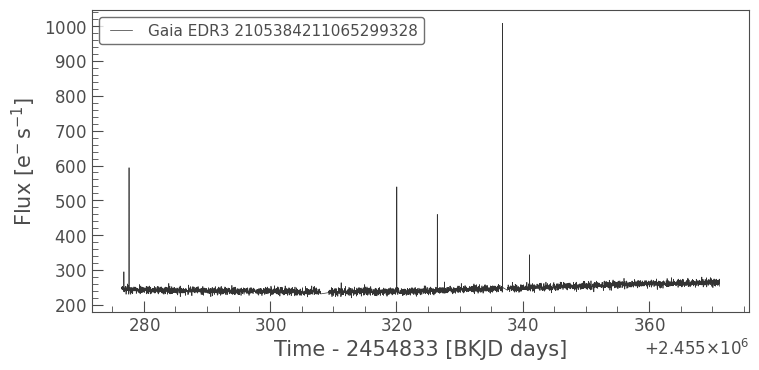

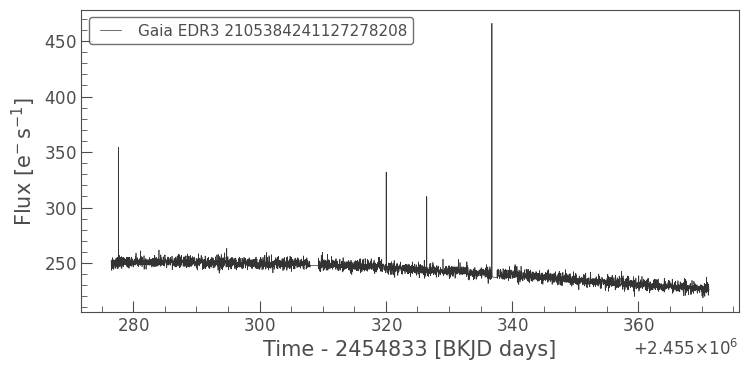

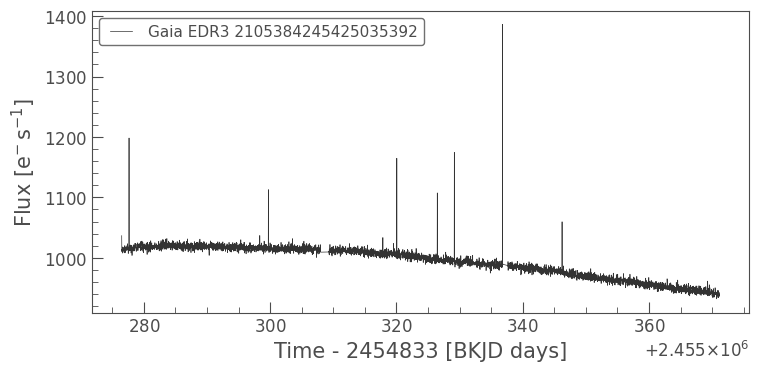

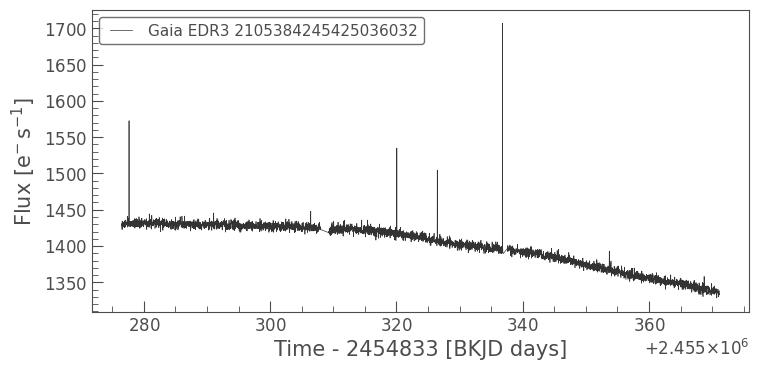

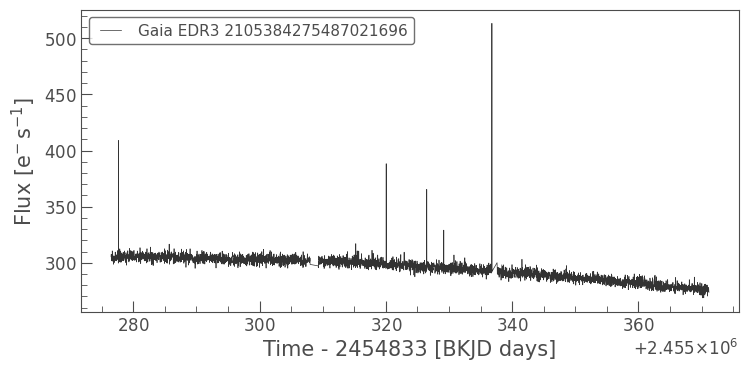

...

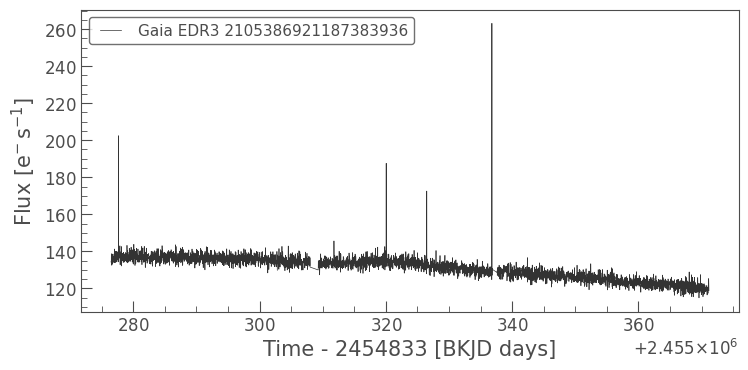

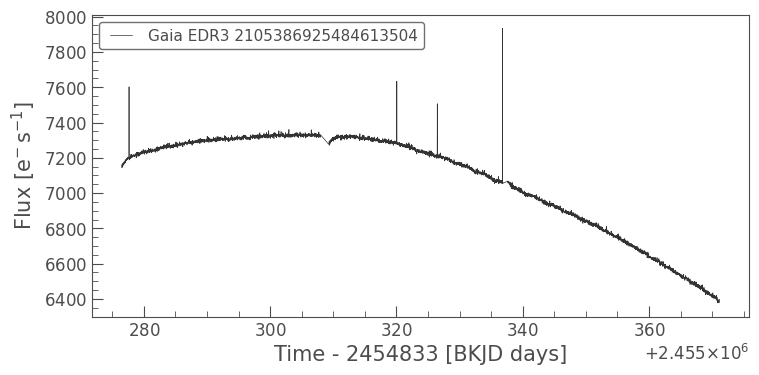

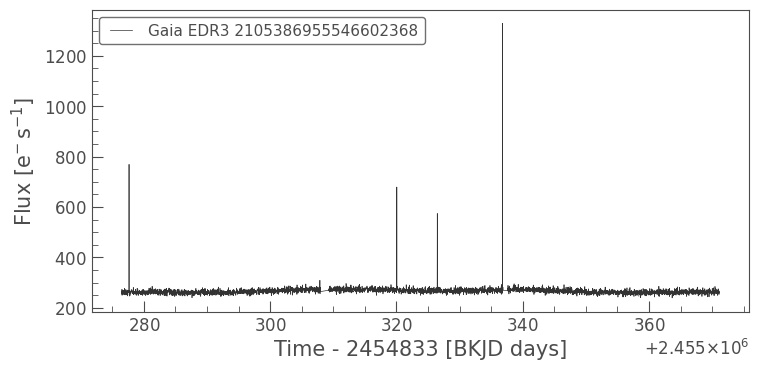

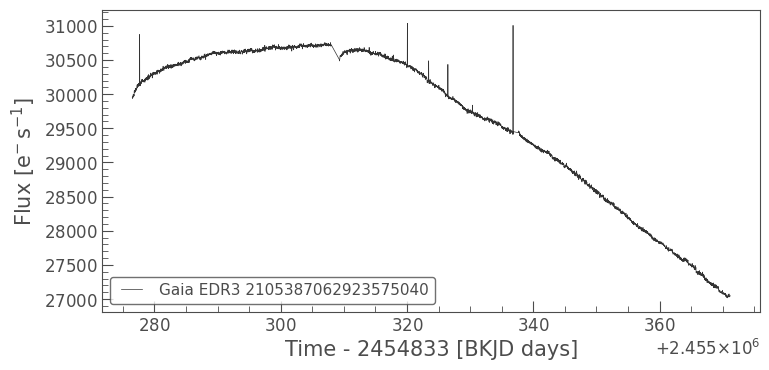

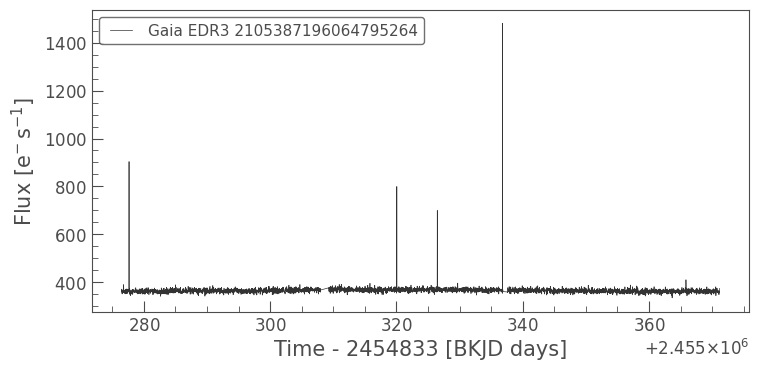

In [225]:
for lc in lcs:
    lc.plot()
    plt.show()

In [175]:
np.linalg.LinAlgError

numpy.linalg.LinAlgError

<AxesSubplot:xlabel='Time - 2454833 [BKJD days]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>

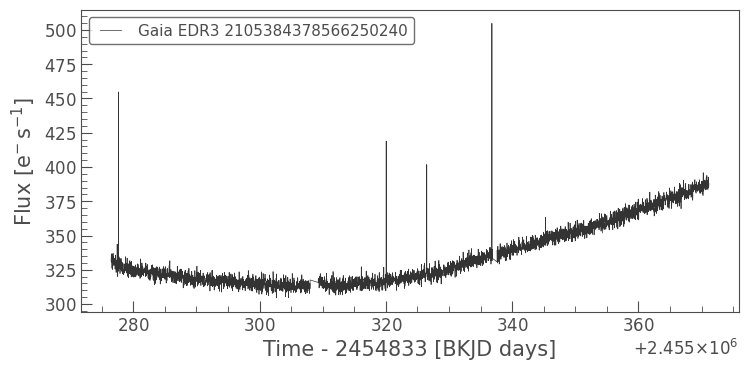

In [239]:
lc = lcs[9].remove_nans()#.normalize()
lc.plot()

In [293]:
rc = lk.RegressionCorrector(lc) # refgression corrector object

In [294]:
# create break points for the DM based in missing cadances
breaks = list(np.where(np.diff(lc.time.jd) > 0.3)[0] + 1)
breaks

[1525, 2866]

In [295]:
np.round((lc.time[-1] - lc.time[0]).value,)

95.0

In [343]:
n_knots = int((lc.time[-1] - lc.time[0]).value / 2)

In [360]:
spline_dm = lk.designmatrix.create_spline_matrix(
    lc.time.jd, n_knots=n_knots, 
    include_intercept=True, name="spline_dm",
    )#.split(breaks)
spline_dm = lk.DesignMatrix(spline_dm.X[:, spline_dm.X.sum(axis=0) != 0], name="spline_dm_clean")

spline_dm

spline_dm_clean DesignMatrix (4492, 47)

<AxesSubplot:title={'center':'spline_dm_clean'}, xlabel='Component', ylabel='X'>

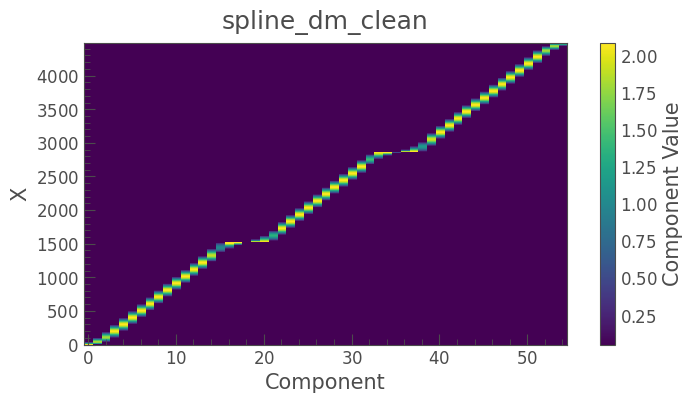

In [345]:
spline_dm.standardize().plot()

In [363]:
offset_dm = lk.DesignMatrix(np.ones_like(lc.time.jd), name='offset')#.split(breaks)
offset_dm.prior_mu = np.ones(1)
offset_dm.prior_sigma = np.ones(1) * 0.000001
offset_dm

offset DesignMatrix (4492, 1)

<AxesSubplot:title={'center':'offset Priors'}, xlabel='Value'>

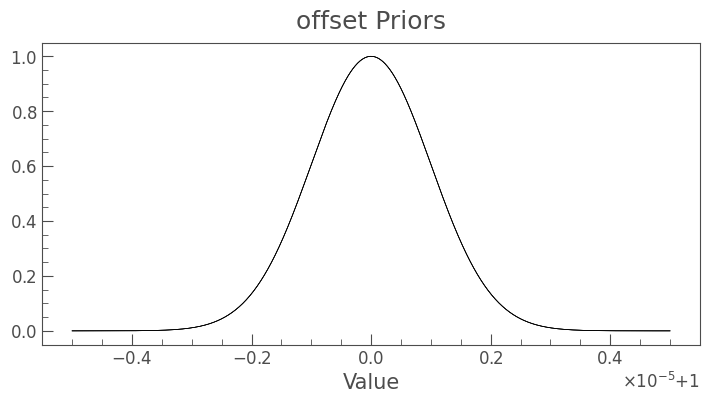

In [347]:
offset_dm.plot_priors()

<AxesSubplot:title={'center':'offset'}, xlabel='Component', ylabel='X'>

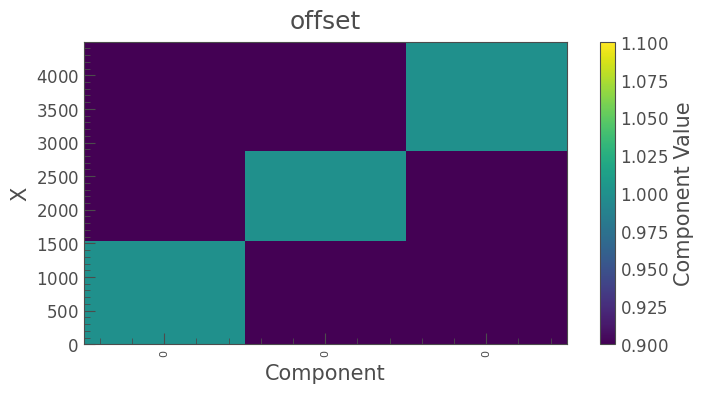

In [348]:
offset_dm.plot()

In [349]:
dmc = lk.DesignMatrixCollection([spline_dm, offset_dm]).standardize()
dmc

DesignMatrixCollection:
	spline_dm_clean DesignMatrix (4492, 55)
	offset DesignMatrix (4492, 3)

<AxesSubplot:title={'center':'Design Matrix Collection'}, xlabel='Component', ylabel='X'>

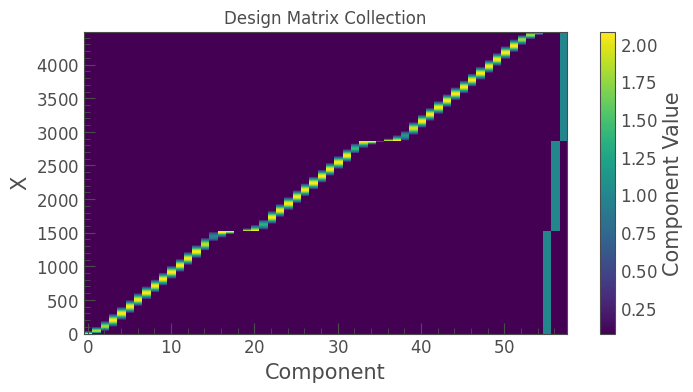

In [350]:
dmc.plot()

In [351]:
poly_dm = lk.DesignMatrix(np.vstack([lc.time.jd**0, lc.time.jd**1, lc.time.jd**2, lc.time.jd**3]).T, 
                          name="poly").standardize().split(breaks)
# poly_dm = poly_dm.pca(nterms=5)
poly_dm

poly DesignMatrix (4492, 12)

<AxesSubplot:title={'center':'poly'}, xlabel='Component', ylabel='X'>

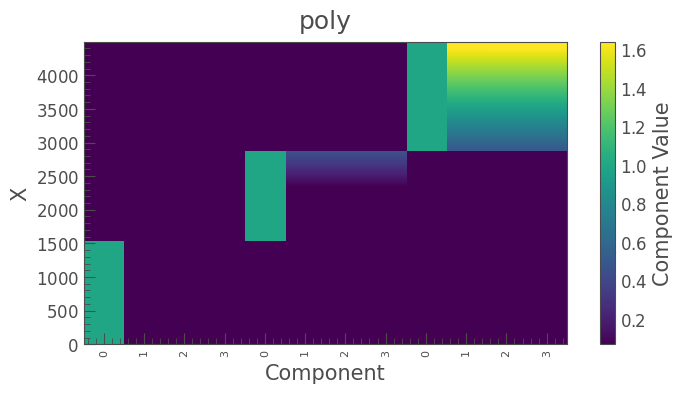

In [352]:
poly_dm.plot()

In [353]:
cbvs = lk.correctors.download_kepler_cbvs(mission="Kepler", quarter=Q, channel=Ch)
cbvs

time,CADENCENO,VECTOR_1,VECTOR_2,VECTOR_3,VECTOR_4,VECTOR_5,VECTOR_6,VECTOR_7,VECTOR_8,VECTOR_9,VECTOR_10,VECTOR_11,VECTOR_12,VECTOR_13,VECTOR_14,VECTOR_15,VECTOR_16,GAP
,,,,,,,,,,,,,,,,,,
object,int32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int32
55275.99115492,16373,0.010814609937369823,-0.03696492686867714,0.03449413925409317,0.010164232924580574,-0.031984712928533554,-0.009007792919874191,6.585707160411403e-05,-0.02954881824553013,0.008538200519979,-0.052015382796525955,-0.009805283509194851,-0.0047074309550225735,-0.017385749146342278,0.014481788501143456,0.015821734443306923,0.027722325176000595,1
55276.01158862,16374,0.010814609937369823,-0.03696492686867714,0.03449413925409317,0.010164232924580574,-0.031984712928533554,-0.009007792919874191,6.585707160411403e-05,-0.02954881824553013,0.008538200519979,-0.052015382796525955,-0.009805283509194851,-0.0047074309550225735,-0.017385749146342278,0.014481788501143456,0.015821734443306923,0.027722325176000595,0
55276.03202212,16375,0.010860140435397625,-0.036695320159196854,0.03284269943833351,0.012971322983503342,-0.03511542081832886,-0.010476275347173214,0.004061337094753981,-0.03209219500422478,0.0008300843182951212,-0.04705587401986122,-0.0254108477383852,-0.014291723258793354,-0.003292013658210635,-0.005962385796010494,0.016550946980714798,0.02033914253115654,0
55276.05245572,16376,0.010954990051686764,-0.03718201071023941,0.03448373079299927,0.015839146450161934,-0.0327371284365654,-0.008914553560316563,0.0019517394248396158,-0.0231154952198267,0.0030258100014179945,-0.04746633023023605,-0.02358022704720497,-0.015589369460940361,-0.011943710036575794,-0.0019085403764620423,0.011604259721934795,0.044286664575338364,0
55276.07288942,16377,0.010983374901115894,-0.03581360727548599,0.034570254385471344,0.010906255804002285,-0.03182700648903847,-0.016581179574131966,-0.006917629390954971,-0.031024634838104248,0.0025378153659403324,-0.05016485974192619,-0.013692774809896946,-0.005351692903786898,-0.008045469410717487,0.011237015016376972,0.01926717720925808,0.045477721840143204,0
55276.09332292,16378,0.011057788506150246,-0.03695844113826752,0.034320905804634094,0.011582695879042149,-0.028314074501395226,-0.018570812419056892,-0.005059055984020233,-0.028753474354743958,-0.005293522961437702,-0.04161612316966057,-0.011304857209324837,-0.008934777230024338,0.005241968668997288,0.004470223095268011,0.006243825424462557,0.030420687049627304,0
55276.11375652,16379,0.011132714338600636,-0.03642067313194275,0.03424004837870598,0.01107657328248024,-0.03152700886130333,-0.017225340008735657,-0.0069018336944282055,-0.03308257460594177,-0.0037200795486569405,-0.05218547582626343,-0.01574488915503025,-0.014443795196712017,0.005249828565865755,0.009947043843567371,0.009590796194970608,0.023159794509410858,0
55276.13419022,16380,0.011168773286044598,-0.03654235973954201,0.0320860855281353,0.00943327322602272,-0.03359261155128479,-0.01422574371099472,-0.008115585893392563,-0.027036814019083977,0.0013824503403156996,-0.044077448546886444,-0.021070657297968864,-0.009049988351762295,-0.010148264467716217,0.019456058740615845,0.017966529354453087,0.02628028765320778,0


In [370]:
cbv_dm.prior_mu

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

(<AxesSubplot:title={'center':'cbv'}, xlabel='Component', ylabel='X'>,
 (4492, 12))

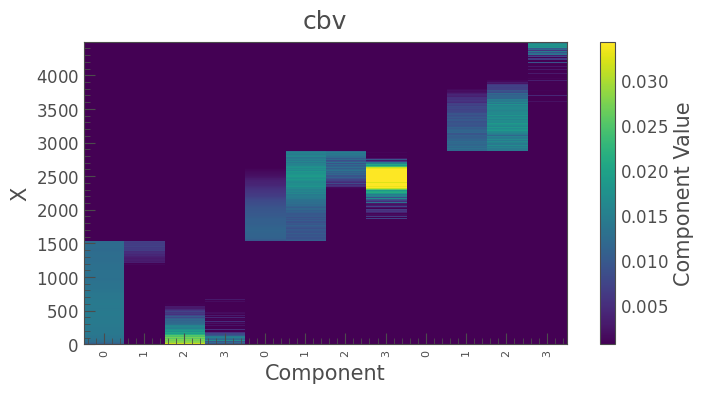

In [357]:
basis = ["VECTOR_1", "VECTOR_2", "VECTOR_3", "VECTOR_4"]
cbv_dm = cbvs[np.in1d(cbvs.cadenceno.value, lc.cadenceno.value)].to_designmatrix()

cbv_dm = lk.DesignMatrix(cbv_dm.X[:, :4], 
                          name="cbv").split(breaks)#.standardize()

cbv_dm.plot(), cbv_dm.shape

<AxesSubplot:title={'center':'Design Matrix Collection'}, xlabel='Component', ylabel='X'>

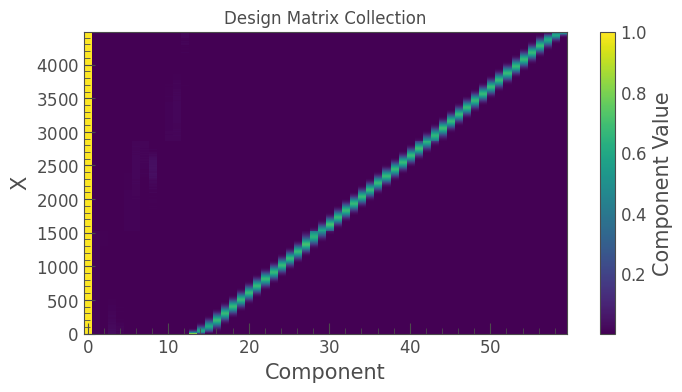

In [379]:
dmc2 = lk.DesignMatrixCollection([offset_dm, cbv_dm, spline_dm])#.standardize()
dmc2.plot()

array([<AxesSubplot:ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
       <AxesSubplot:xlabel='Time - 2454833 [BKJD days]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>],
      dtype=object)

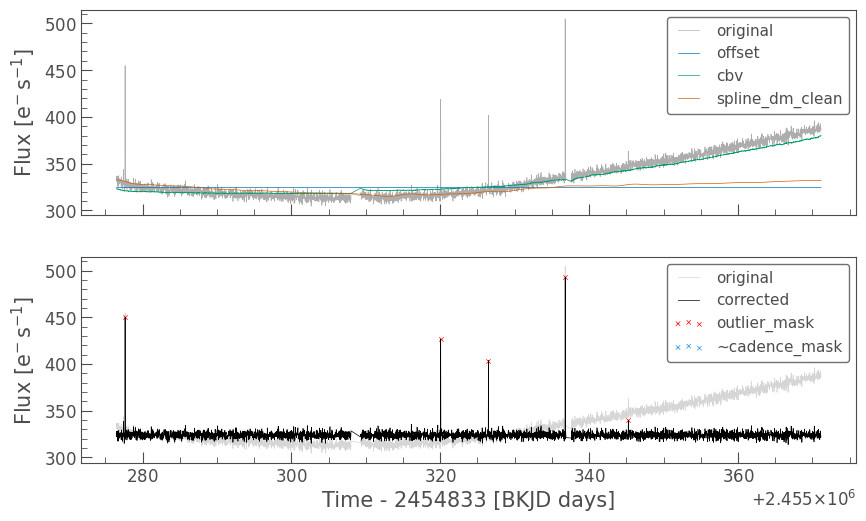

In [380]:
clc = rc.correct(dmc2, sigma=5)
rc.diagnose()

In [84]:
bls = clc.to_periodogram(
            method="bls",
            minimum_period=0.35,
            maximum_period=20,
            frequency_factor=6,
            # duration=0.05
        )

In [85]:
best_fit_period = bls.period_at_max_power
power_snr = bls.snr[np.argmax(bls.power)]

/Users/jorgemarpa/.pyenv/versions/adap/lib/python3.8/site-packages/lightkurve/lightcurve.py:991: LightkurveWarning: The light curve already appears to be in relative units; `normalize()` will convert the light curve into relative units for a second time, which is probably not what you want.
  warnings.warn(
/Users/jorgemarpa/.pyenv/versions/adap/lib/python3.8/site-packages/lightkurve/lightcurve.py:876: LightkurveWarning: `epoch_time` appears to be given in JD, however the light curve time uses BKJD (i.e. JD - 2454833).
  warnings.warn(
No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


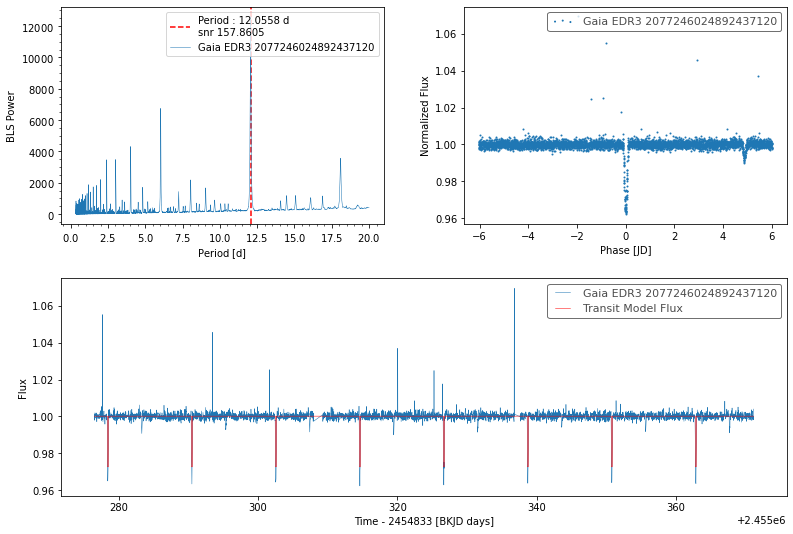

In [86]:
fig = plt.figure(figsize=(13, 9))

plt.subplots_adjust(wspace=0.25, hspace=0.25)

sub1 = fig.add_subplot(2, 2, 1)
sub1.axvline(
    best_fit_period.value,
    color="r",
    linestyle="--",
    label="Period : %.4f d \nsnr %.4f"
    % (best_fit_period.value, power_snr),
)
bls.plot(ax=sub1)
sub1.legend()

sub2 = fig.add_subplot(2, 2, 2)
clc.normalize().fold(
    period=best_fit_period,
    epoch_time=bls.transit_time_at_max_power,
).scatter(ax=sub2, alpha=1)

sub3 = fig.add_subplot(2, 2, (3, 4))
clc.plot(ax=sub3)
bls.get_transit_model().plot(ax=sub3, color="r")
plt.show()

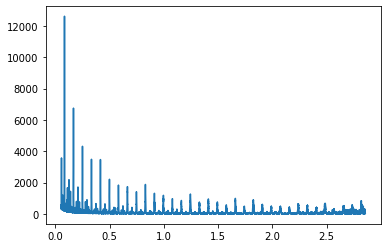

In [91]:
plt.plot(bls.frequency, bls.power)

In [87]:
bls.compute_stats()

No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


{'transit_times': <Time object: scale='tdb' format='bkjd' value=[2455278.44987176 2455290.50569603 2455302.5615203  2455314.61734456
  2455326.67316883 2455338.7289931  2455350.78481736 2455362.84064163]>,
 'per_transit_count': array([7, 7, 7, 7, 7, 7, 6, 7]),
 'per_transit_log_likelihood': array([1403.38878087, 1522.08848889, 1665.62160024, 1637.21463161,
        1629.52943935, 1640.08791094, 1417.66457501, 1699.42110474]),
 'depth': (<Quantity 0.02744707>, <Quantity 0.00017387>),
 'depth_phased': (<Quantity 0.00014518>, <Quantity 0.00018429>),
 'depth_half': (<Quantity 0.01459939>, <Quantity 0.00012721>),
 'depth_odd': (<Quantity 0.02757791>, <Quantity 0.00024266>),
 'depth_even': (<Quantity 0.02731074>, <Quantity 0.00024768>),
 'harmonic_amplitude': <Quantity 0.00062825>,
 'harmonic_delta_log_likelihood': -12190.030364858725}

In [89]:
bls.duration[np.argmax(bls.power)], bls.depth[np.argmax(bls.power)]

(<Quantity 0.15 d>, <Quantity 0.02744707>)

In [96]:
bls.duration_at_max_power

<Quantity 0.15 d>

In [62]:
bls.__dir__()

['duration',
 'depth',
 'snr',
 '_BLS_result',
 '_BLS_object',
 'transit_time',
 'time',
 'flux',
 'time_unit',
 'frequency',
 'power',
 'nyquist',
 'label',
 'targetid',
 'default_view',
 'meta',
 '__module__',
 '__doc__',
 '__init__',
 '__repr__',
 'from_lightcurve',
 'compute_stats',
 'get_transit_model',
 'get_transit_mask',
 'transit_time_at_max_power',
 'duration_at_max_power',
 'depth_at_max_power',
 'plot',
 'flatten',
 'smooth',
 '_validate_view',
 '_is_evenly_spaced',
 'period',
 'max_power',
 'frequency_at_max_power',
 'period_at_max_power',
 'bin',
 'to_table',
 'copy',
 '__getitem__',
 '__add__',
 '__radd__',
 '__sub__',
 '__rsub__',
 '__mul__',
 '__rmul__',
 '__truediv__',
 '__rtruediv__',
 '__div__',
 '__rdiv__',
 'show_properties',
 'to_seismology',
 '__dict__',
 '__weakref__',
 '__hash__',
 '__str__',
 '__getattribute__',
 '__setattr__',
 '__delattr__',
 '__lt__',
 '__le__',
 '__eq__',
 '__ne__',
 '__gt__',
 '__ge__',
 '__new__',
 '__reduce_ex__',
 '__reduce__',
 '__su

In [23]:
df = pd.DataFrame(
    np.array([cat.designation, metricCmpl, metricCrwd]).T,
    columns=["designation", "FLFRSAP", "CRWDSAP"],
)
df

,designation,FLFRSAP,CRWDSAP
0,Gaia EDR3 2126834338596658304,0.5863,0.9993
1,Gaia EDR3 2126834372956402304,0.3127,0.9998
2,Gaia EDR3 2126834372956408960,0.8257,0.9963
3,Gaia EDR3 2126834372956410368,0.2872,0.9996
4,Gaia EDR3 2126834377256160768,0.2947,1.0
...,...,...,...
70,Gaia EDR3 2126836198316107136,0.8227,0.7483
71,Gaia EDR3 2126836198321278720,0.2616,0.8215
72,Gaia EDR3 2126836198321280640,0.5485,0.8552
73,Gaia EDR3 2126836262742080384,0.4258,0.9884


spline_dm DesignMatrix (4492, 108)

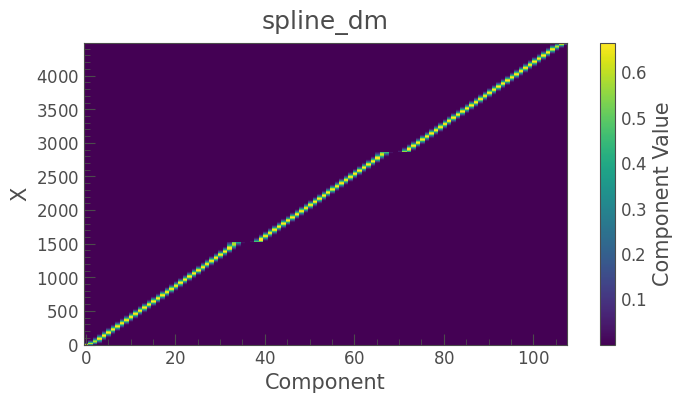

In [24]:
times = lcs[0].time.jd
breaks = list(np.where(np.diff(times) > 0.3)[0] + 1)
spline_dm = lk.designmatrix.create_spline_matrix(
    times,
    n_knots=100,
    include_intercept=True,
    name="spline_dm",
).split(breaks)
spline_dm = lk.DesignMatrix(
    spline_dm.X[:, spline_dm.X.sum(axis=0) != 0], name="spline_dm"
)
spline_dm.plot();
spline_dm

In [25]:
pmin, pmax, ffrac = 0.35, 20, 6

corrected_lcs = []
best_periods, periods_snr = [], []
power, periods = [], []

for i, lc in tqdm(enumerate(lcs), desc="BLS search: ", total=len(lcs)):
    rc = lk.RegressionCorrector(lc)
    clc = rc.correct(spline_dm)
    corrected_lcs.append(clc)
    
    # clc = clc.remove_outliers(sigma_lower=1e10, sigma_upper=5)
    periodogram = clc.to_periodogram(
        method="bls",
        minimum_period=pmin,
        maximum_period=pmax,
        frequency_factor=ffrac,
    )

    best_fit_period = periodogram.period_at_max_power.value
    power_snr = periodogram.snr[np.argmax(periodogram.power)].value
    best_periods.append(best_fit_period)
    periods_snr.append(power_snr)
    power.append(periodogram.power)
    periods.append(periodogram.period)
    
    # if i == 5: break

power = np.array(power)
periods = np.array(periods)

df["BLS_period"] = np.array(best_periods)
df["BLS_period_SNR"] = np.array(periods_snr)

BLS search:   0%|          | 0/75 [00:00<?, ?it/s]

In [26]:
mean_power, std_power = power.mean(), power.std()

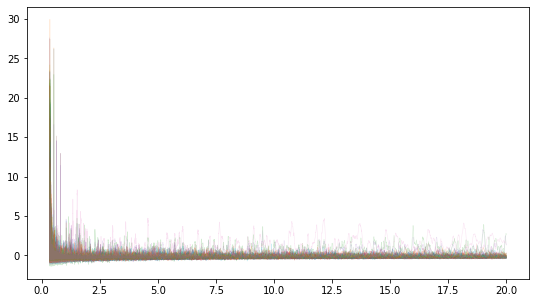

In [27]:
plt.figure(figsize=(9, 5))

for pow, pers in zip(power, periods):
    plt.plot(pers, (pow - pow.mean()) / pow.std(), lw=0.5, alpha=.2)

plt.show()

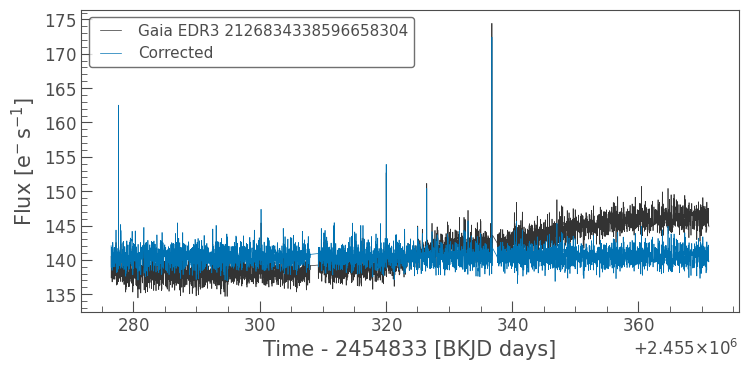

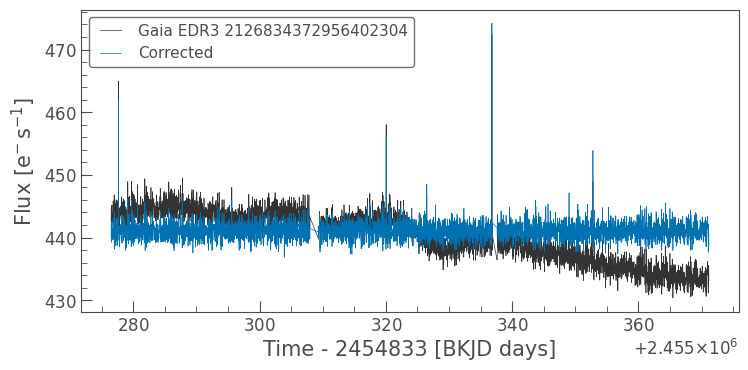

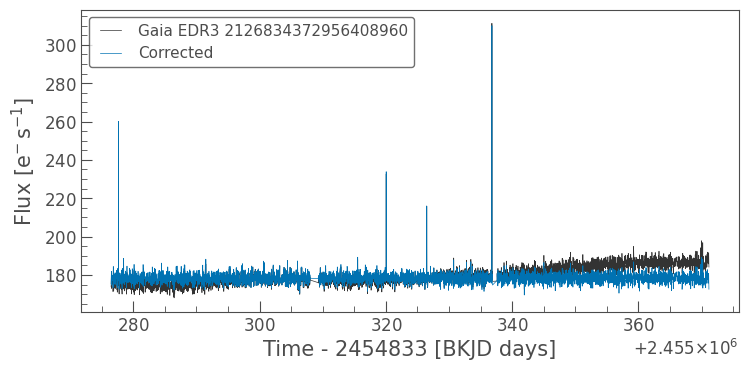

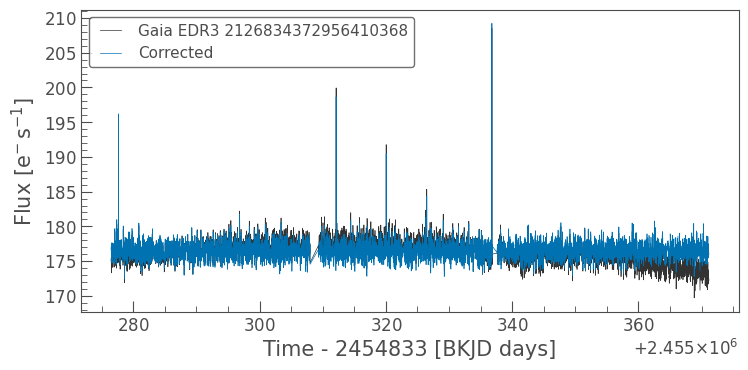

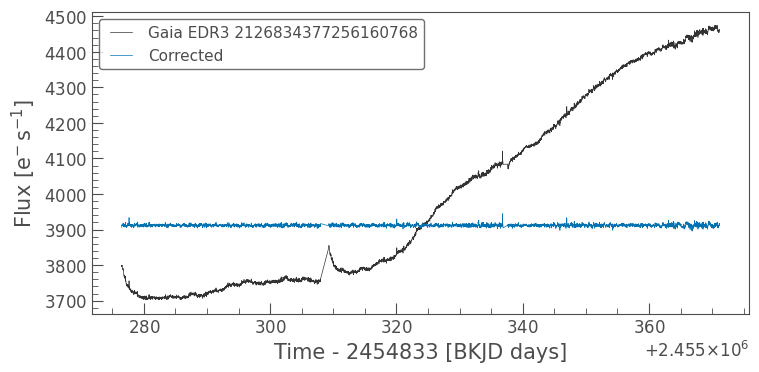

...

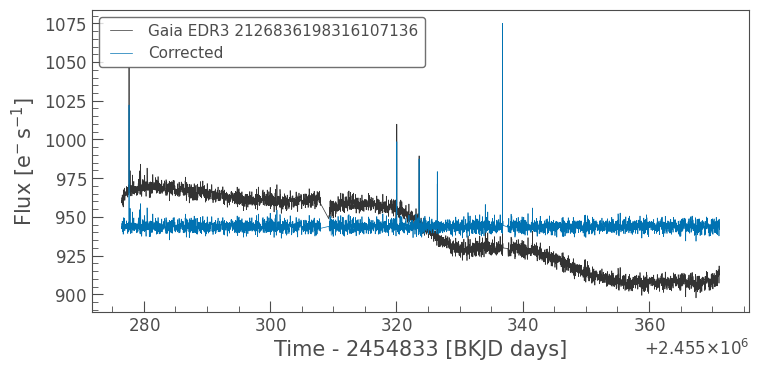

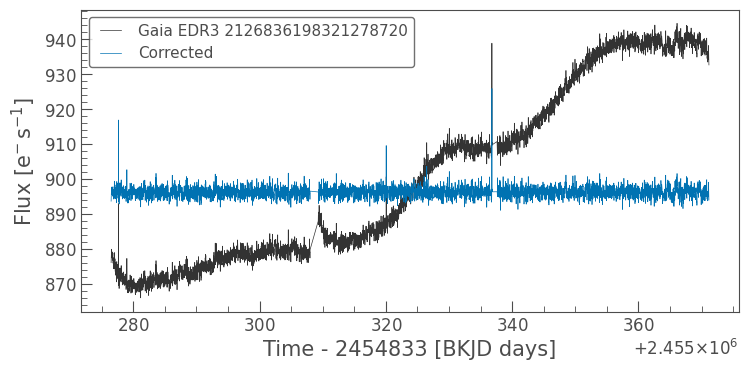

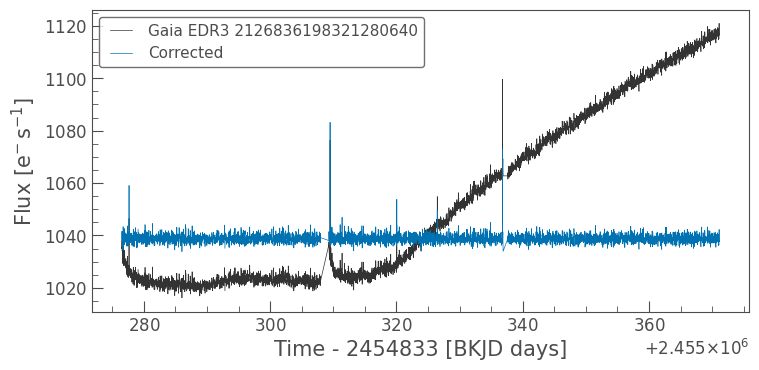

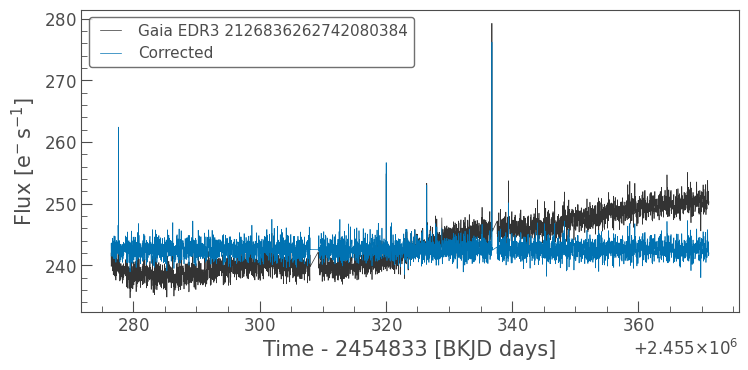

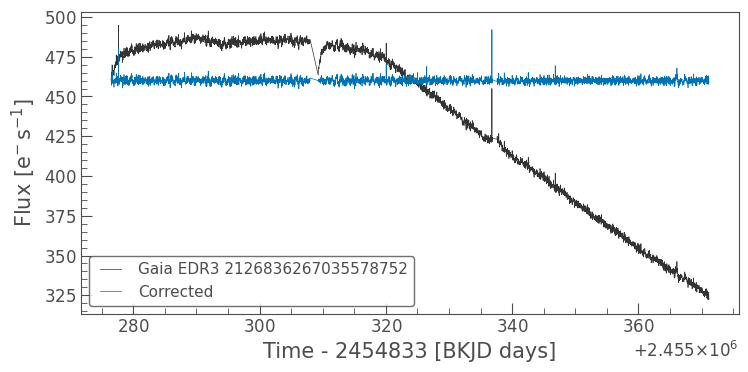

In [28]:
for lc, clc in zip(lcs, corrected_lcs):
    ax = lc.plot()
    clc.plot(ax=ax, label="Corrected")
    plt.show()

In [381]:
quarter = 5
channel = 1

Loading LCs:   0%|          | 0/38 [00:00<?, ?it/s]

Regressor Corrector:   0%|          | 0/38 [00:00<?, ?it/s]

O


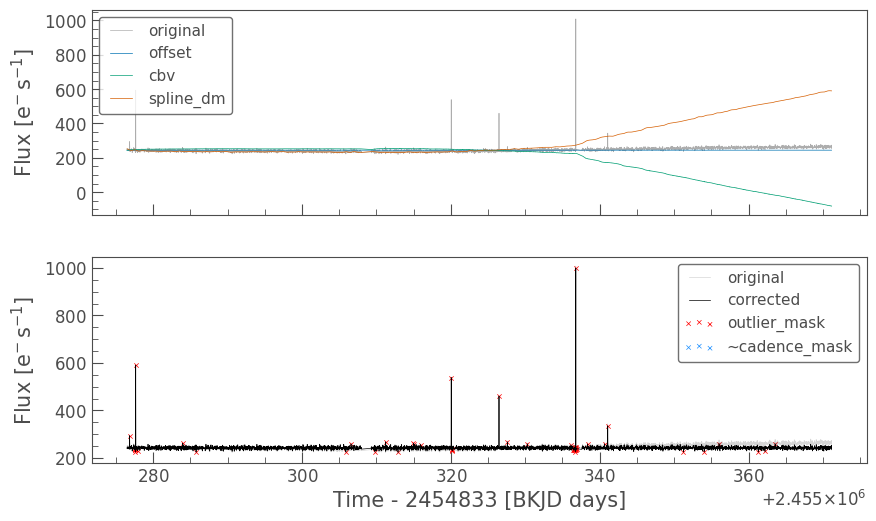

1


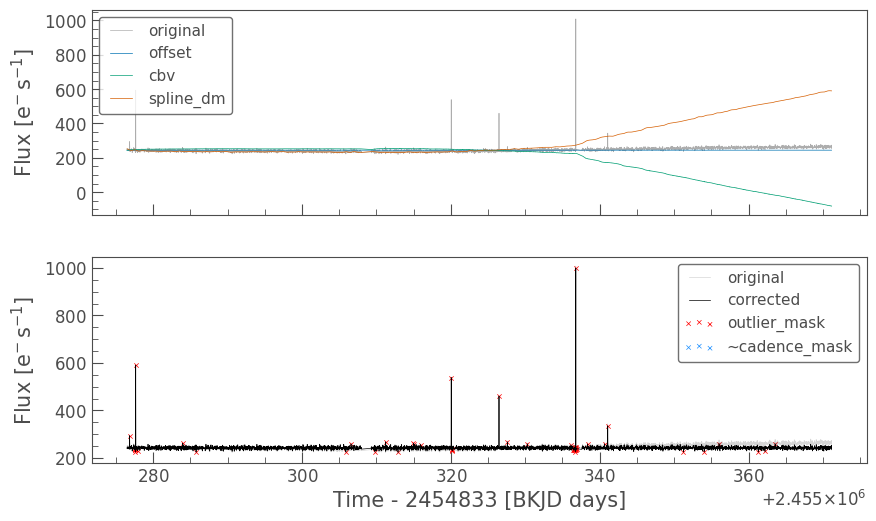

2


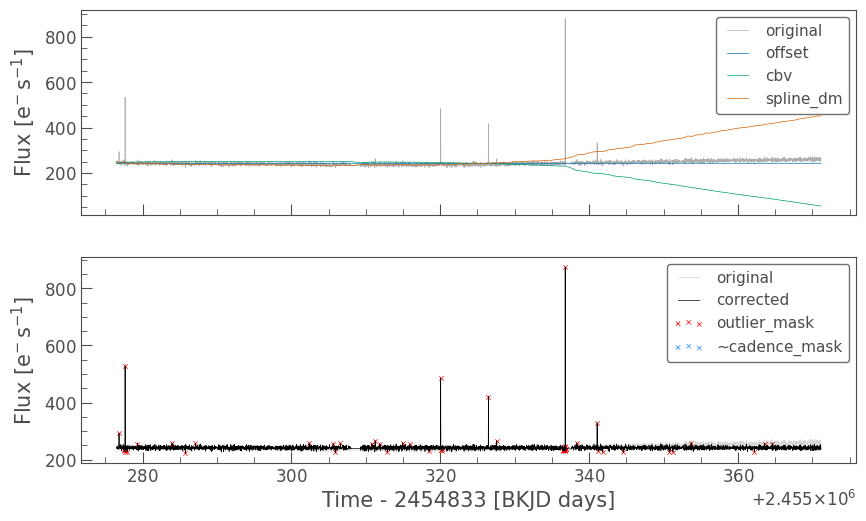

3


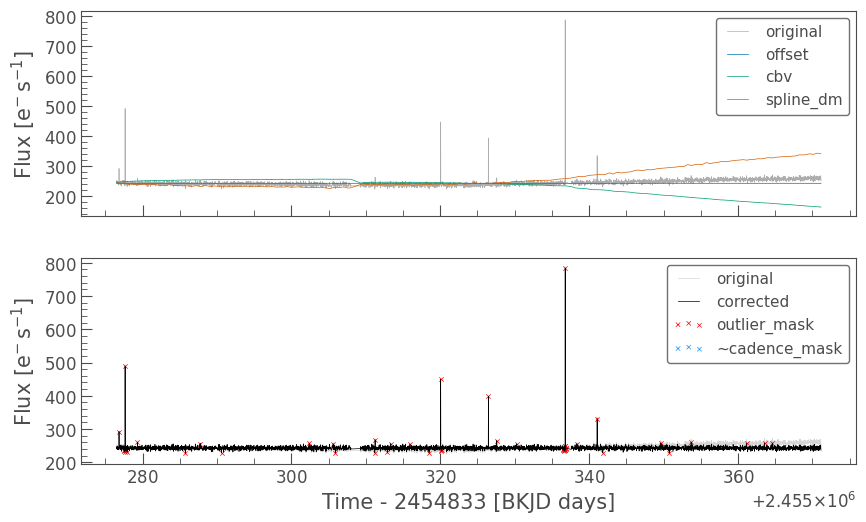

4


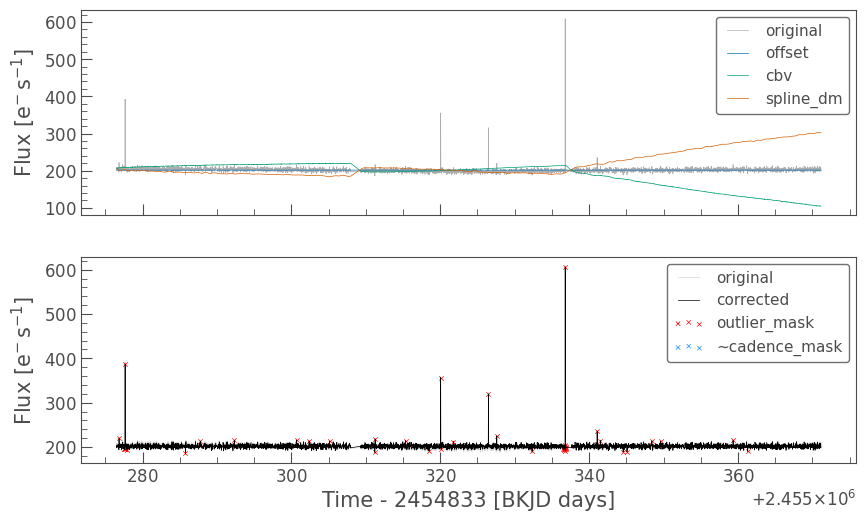

5


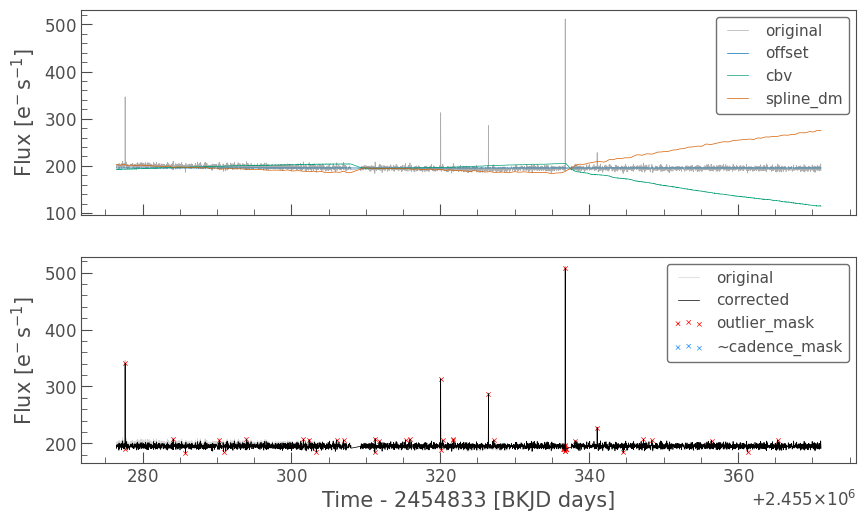

6


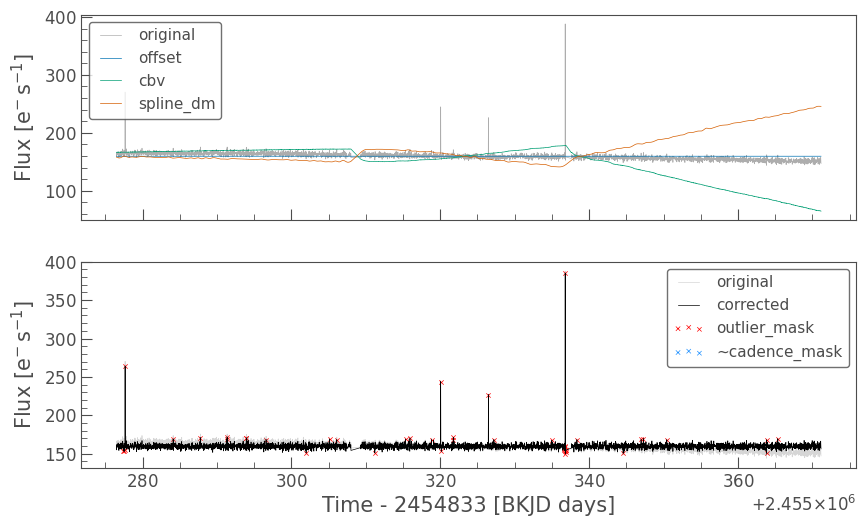

7


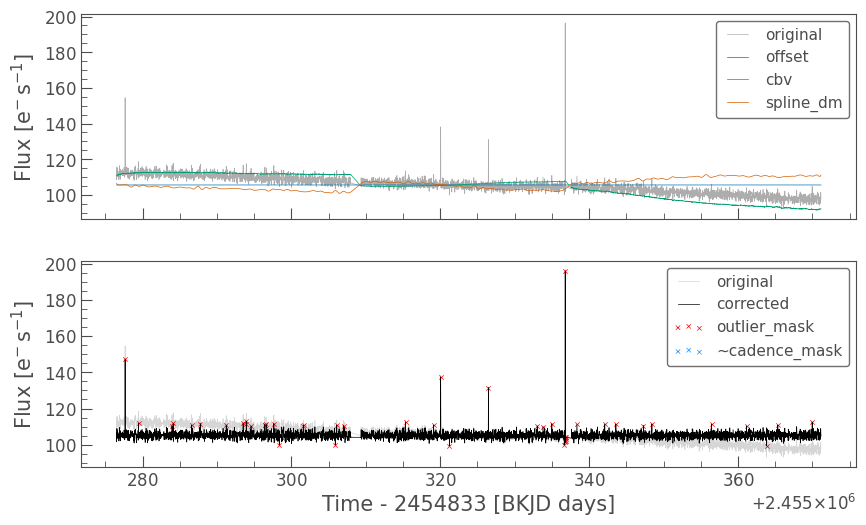

_______________________________
O


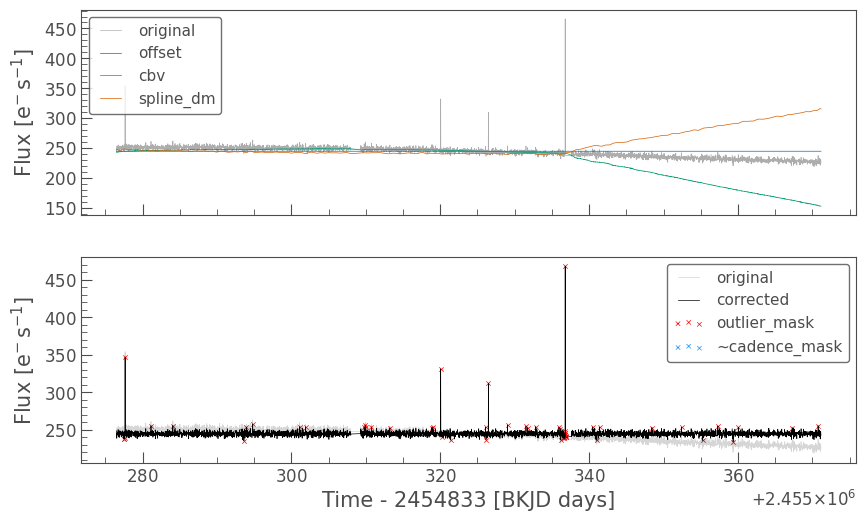

1


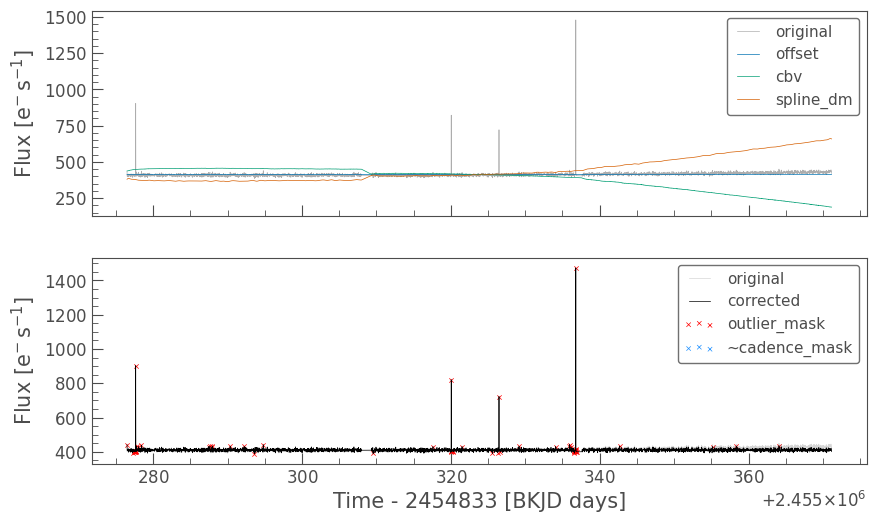

2


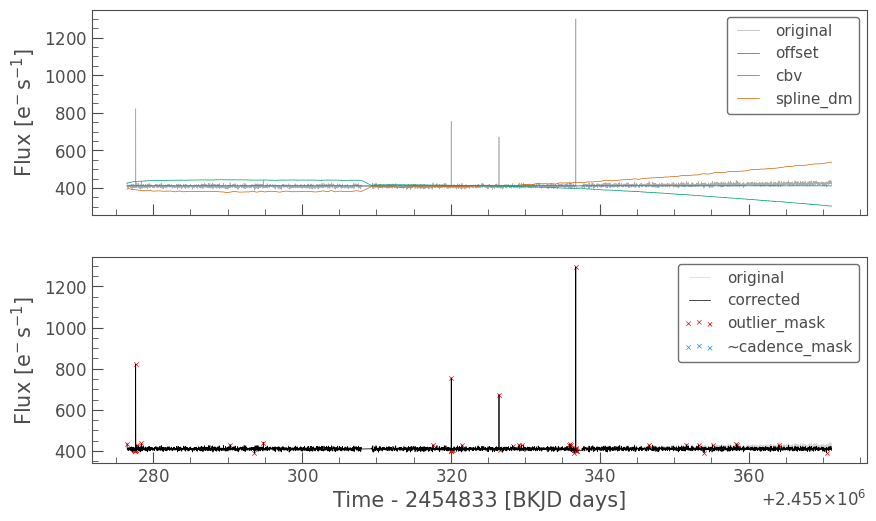

3


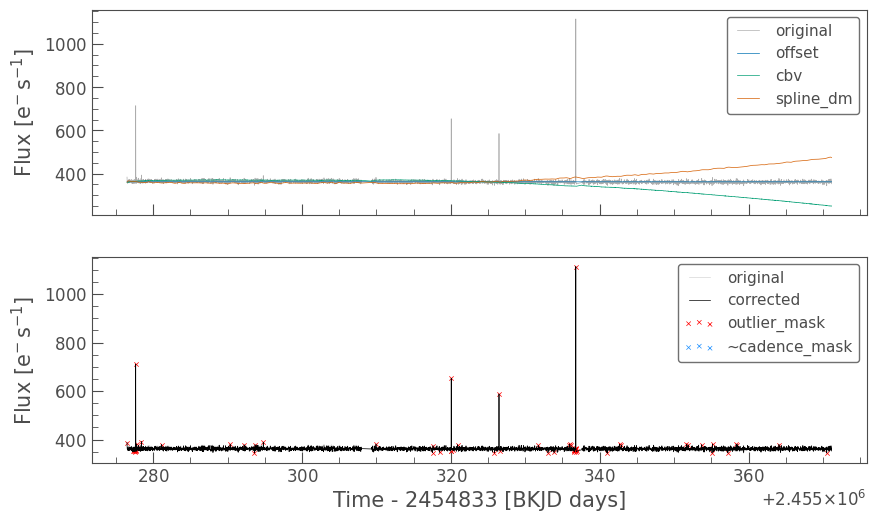

4


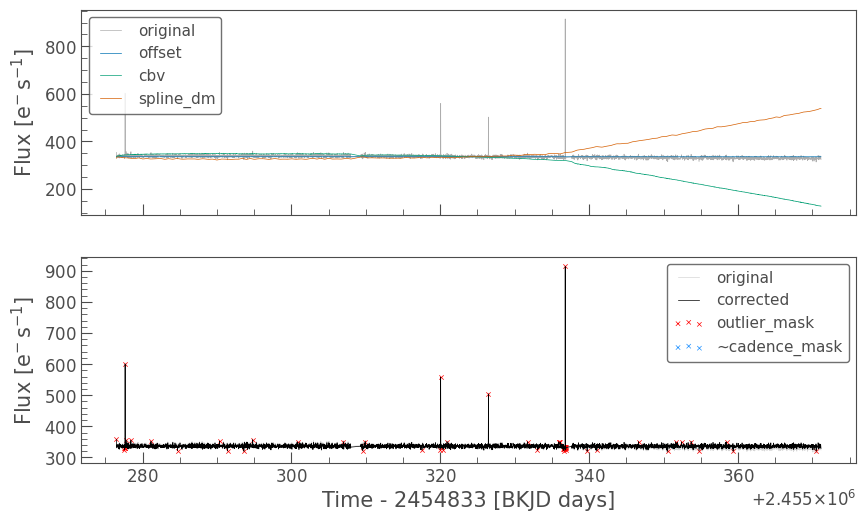

5


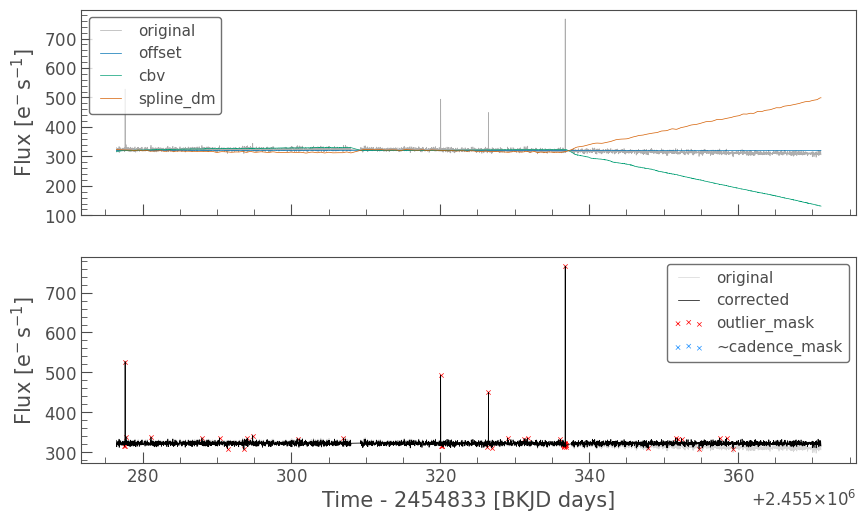

6


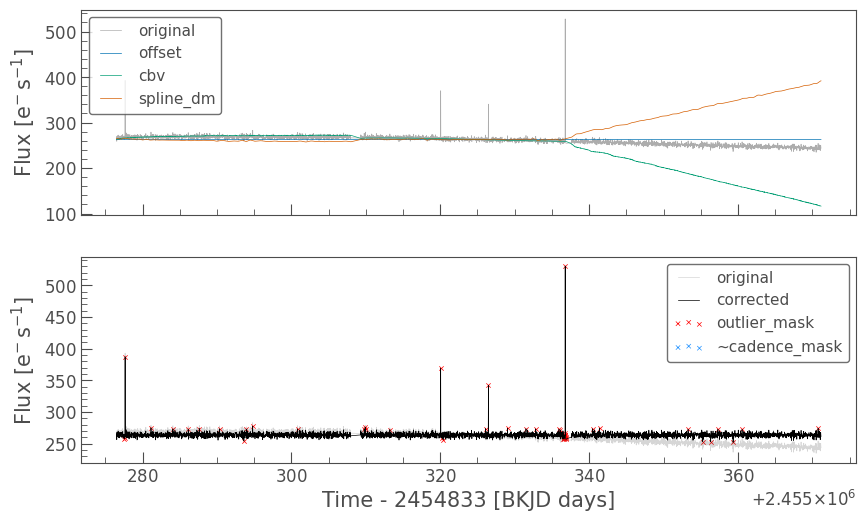

7


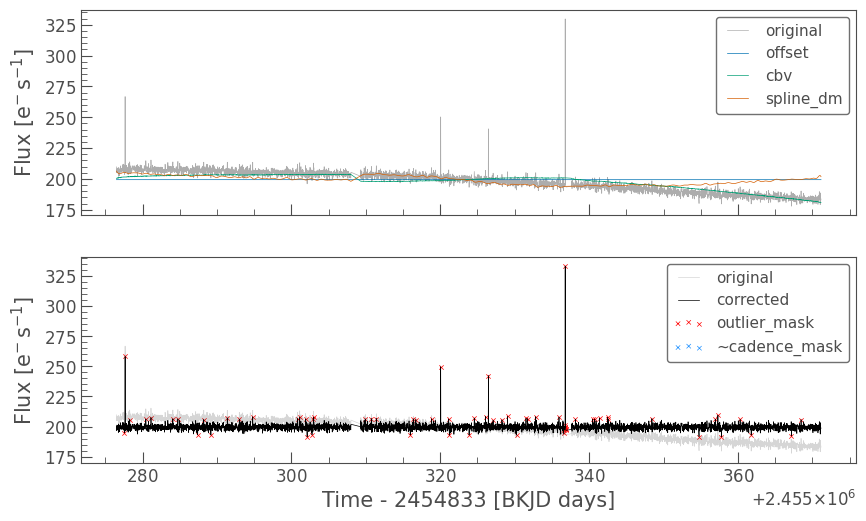

_______________________________
O


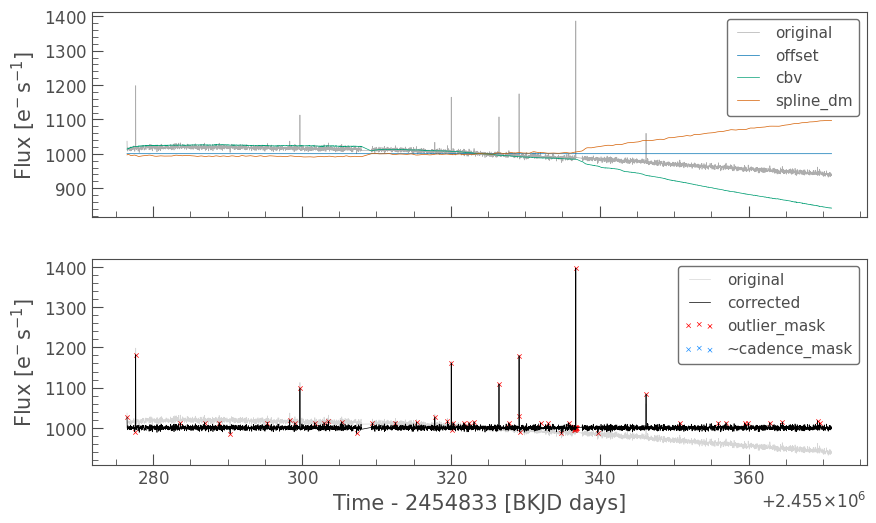

1


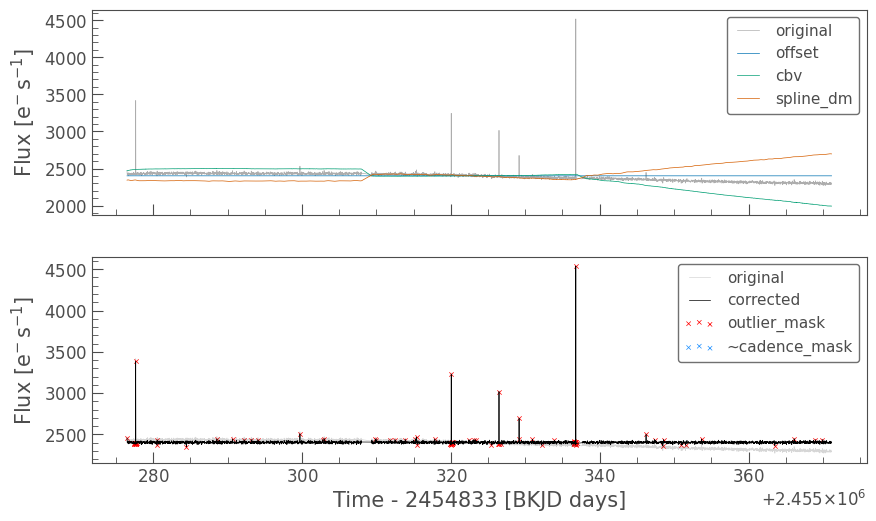

2


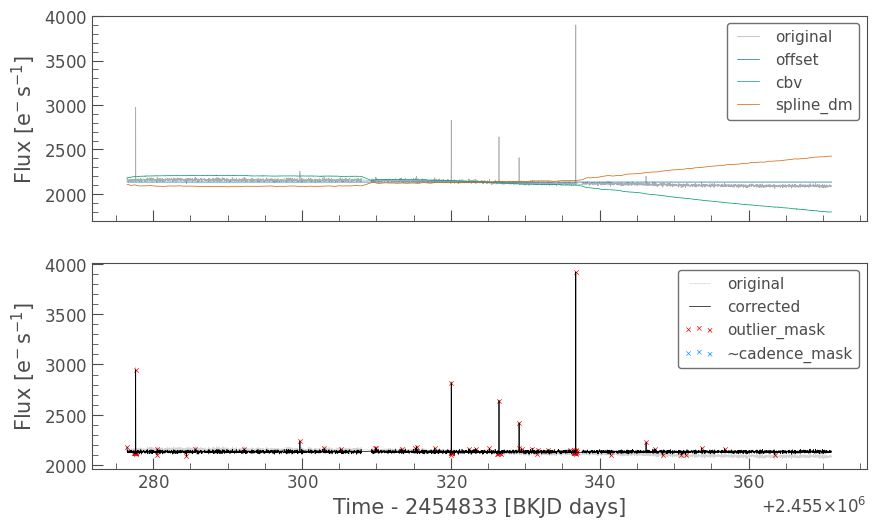

3


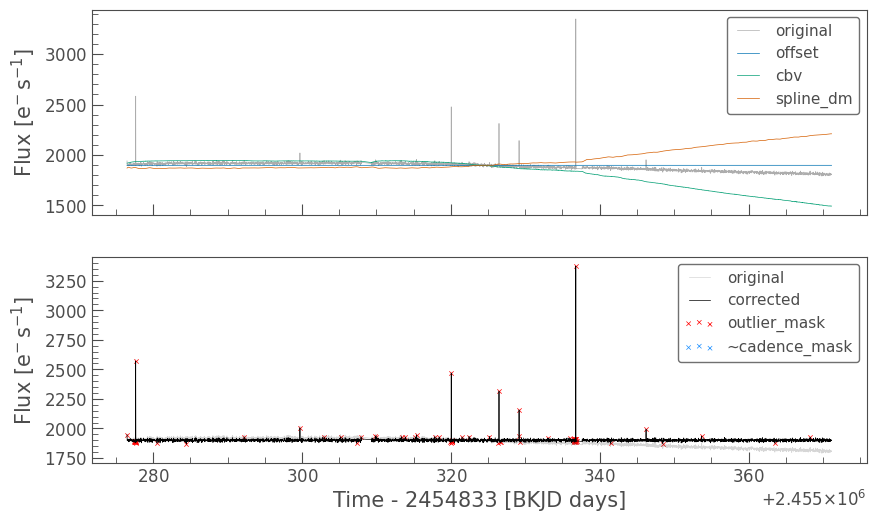

4


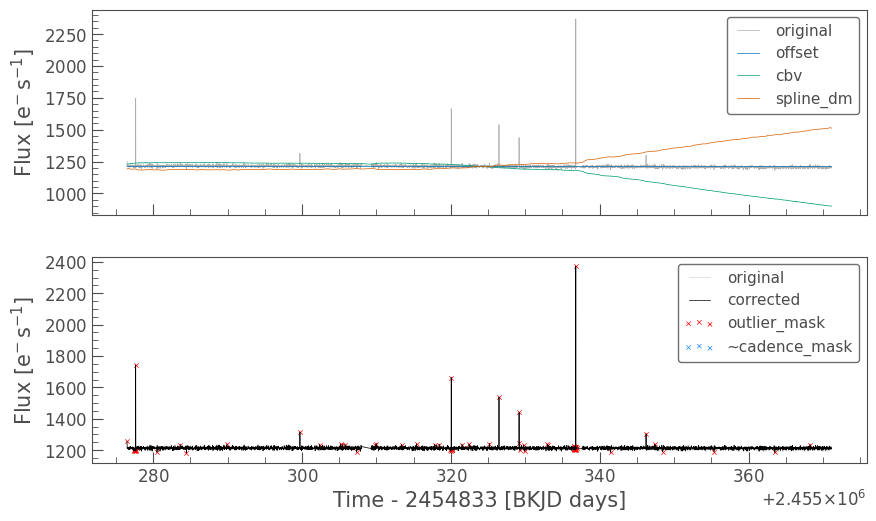

5


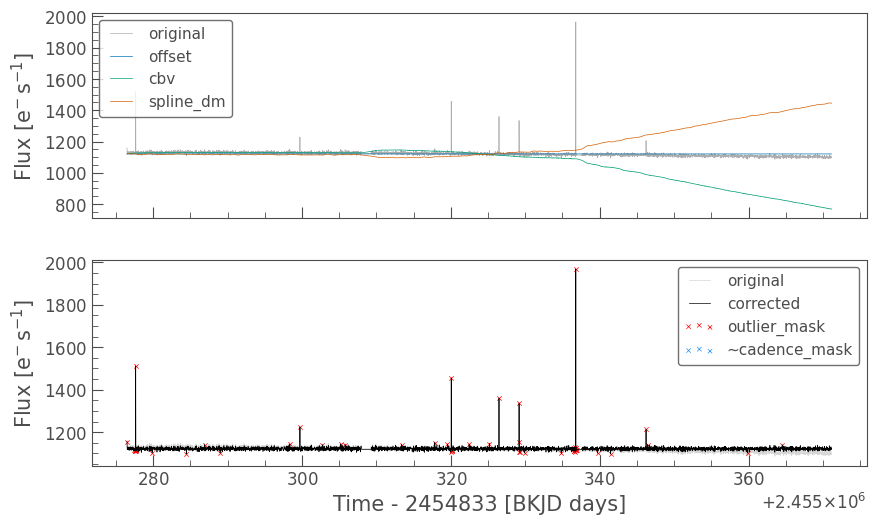

6


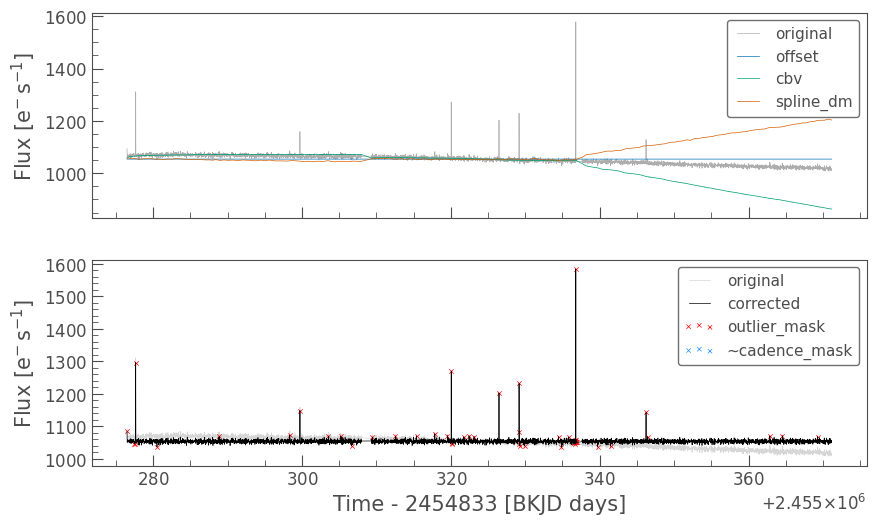

7


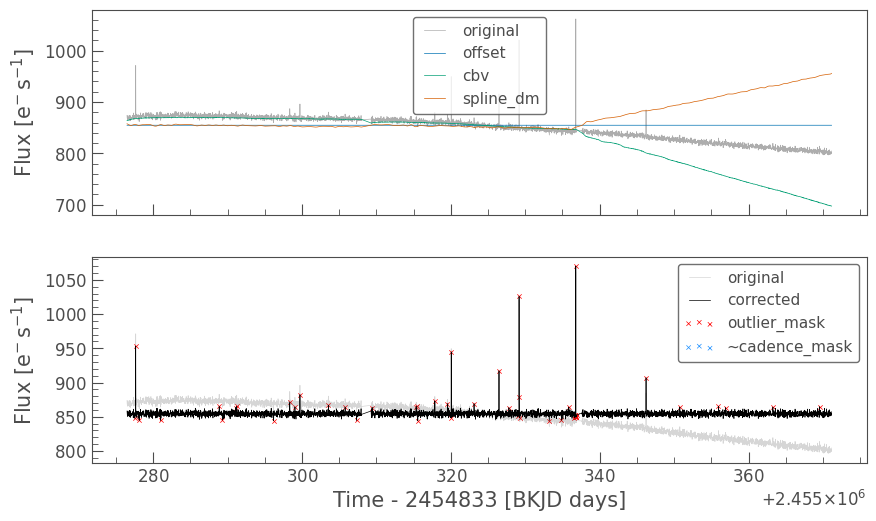

In [386]:
hdu = fits.open(
    "../data/export/%i/%02i/image_gaiadr3.fits.gz" % (quarter,channel)
)
hdr = hdu[0].header
img = hdu[1].data
catalog = Table(hdu[2].data).to_pandas()

# load LCs
lc_files = np.sort(
    glob.glob(
        "../data/export/%i/%02i/lc__Gaia_EDR3_*.fits.gz"
        % (quarter, channel)
    )
)
apertures = ["O", 1, 2, 3, 4, 5, 6, 7]

lcs = []
for f in tqdm(lc_files, desc="Loading LCs"):
    meta = fits.open(f)[0].header
    lc = lk.KeplerLightCurve.read(f)
    lc.label = meta["LABEL"]
    lcs.append(lc)

# creating Design matrix
times = lcs[0].time.jd
breaks = list(np.where(np.diff(times) > 0.3)[0] + 1)
# spline DM
n_knots = int((lc.time[-1] - lc.time[0]).value / 0.5)
spline_dm = lk.designmatrix.create_spline_matrix(
    times,
    n_knots=n_knots,
    include_intercept=True,
    name="spline_dm",
)  # .split(breaks)
spline_dm = lk.DesignMatrix(
    spline_dm.X[:, spline_dm.X.sum(axis=0) != 0], name="spline_dm"
)
# offset matrix
offset_dm = lk.DesignMatrix(np.ones_like(times), name="offset")  # .split(breaks)
offset_dm.prior_mu = np.ones(1)
offset_dm.prior_sigma = np.ones(1) * 0.000001

# DM with CBVs, first 4 only
cbvs = lk.correctors.download_kepler_cbvs(
    mission="Kepler", quarter=quarter, channel=channel
)
basis = 4
cbv_dm = cbvs[np.in1d(cbvs.cadenceno.value, lc.cadenceno.value)].to_designmatrix()
cbv_dm = lk.DesignMatrix(cbv_dm.X[:, :basis], name="cbv").split(breaks)
cbv_dm.prior_mu = np.ones(basis * (len(breaks) + 1))
cbv_dm.prior_sigma = np.ones(basis * (len(breaks) + 1)) * 100000

# collection of DMs
dmc = lk.DesignMatrixCollection([offset_dm, cbv_dm, spline_dm])

pmin, pmax, ffrac = 0.5, 30, 10
duration_in = [0.03, 0.05, 0.10, 0.125, 0.15, 0.175, 0.20, 0.25, 0.33, 0.4, 0.45]
period_in = 1 / np.linspace(1 / pmin, 1 / pmax, 60000)

corrected_lcs = []
for i, lc in tqdm(enumerate(lcs), desc="Regressor Corrector: ", total=len(lcs)):
    lc_cor = lc.copy()
    for ap in apertures:
        lc_aux = lc.copy()
        ext = ap if ap != "O" else ""
        lc_aux.flux = lc["flux%s" % str(ext)]
        lc_aux.flux_err = lc["flux_err%s" % str(ext)]
        rc = lk.RegressionCorrector(lc_aux)
        try:
            clc = rc.correct(dmc, sigma=3)
            if True:
                rc.diagnose()
                plt.show()
        except np.linalg.LinAlgError:
            clc = lc.copy()
        lc_cor["flux%s" % str(ext)] = clc.flux
        lc_cor["flux_err%s" % str(ext)] = clc.flux_err

    corrected_lcs.append(lc_cor)
    if i == 

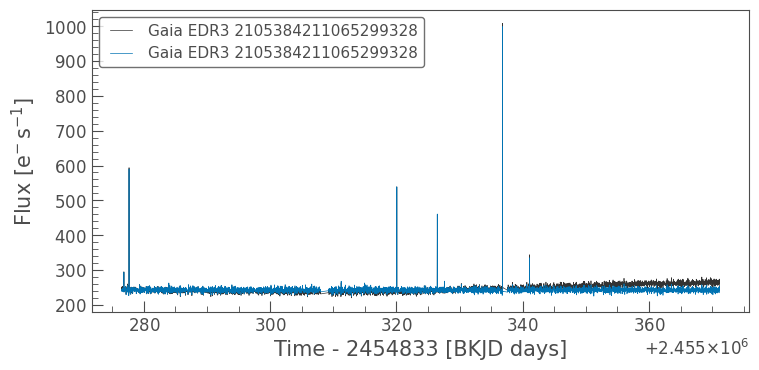

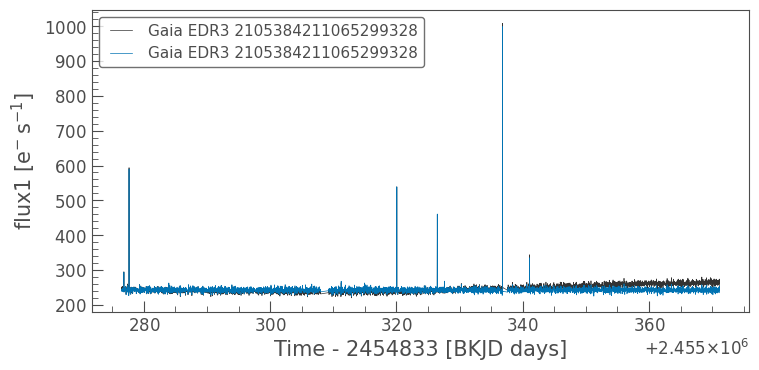

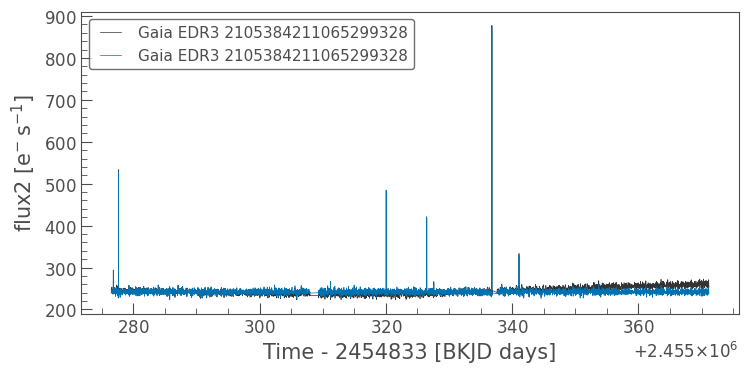

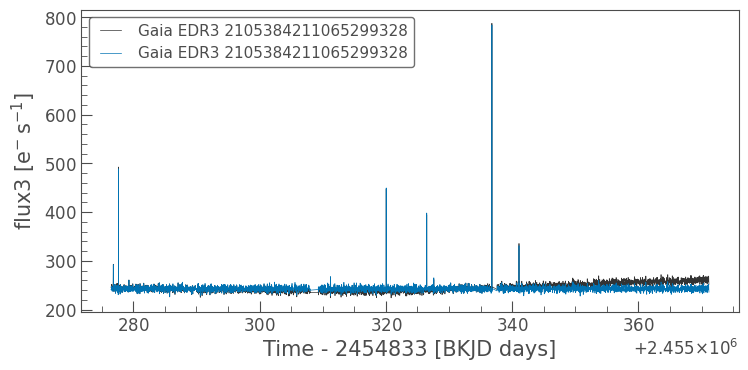

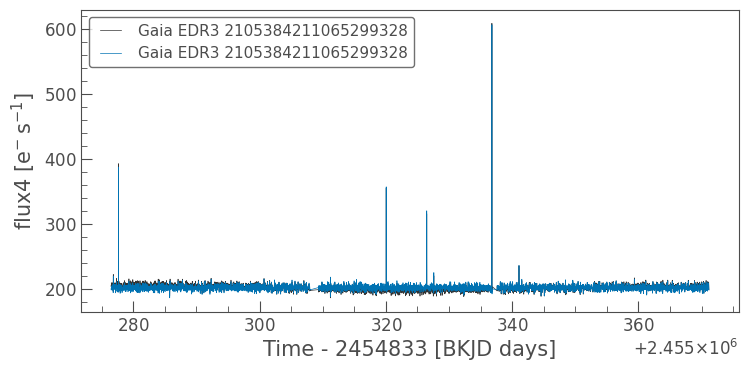

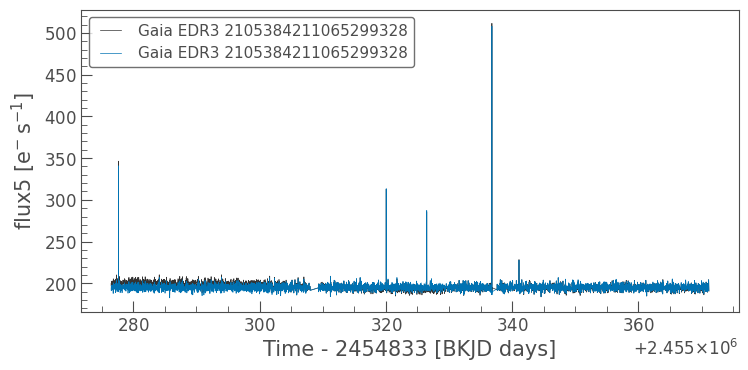

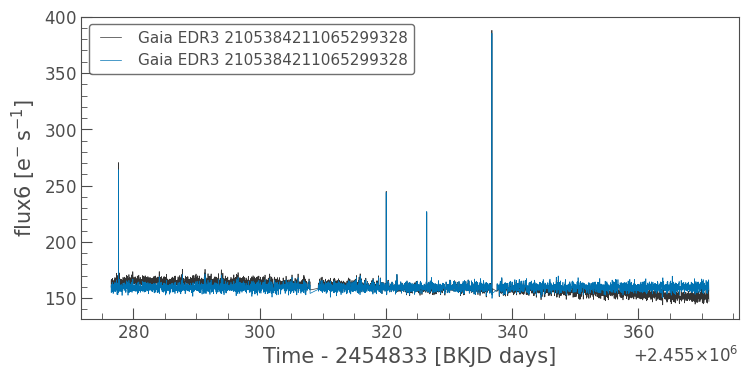

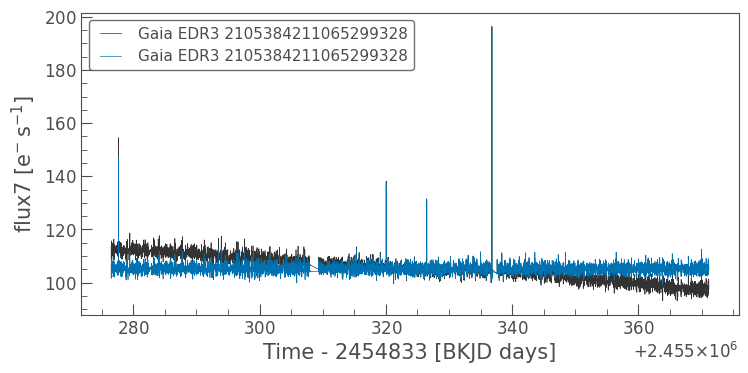

In [393]:
apertures = ["", 1, 2, 3, 4, 5, 6, 7]
for k in apertures:
    ax = lcs[0].plot(column="flux%s" % k)
    corrected_lcs[0].plot(column="flux%s" % k, ax=ax)
    plt.show()

In [422]:
corrected_lcs[0].columns

20

In [421]:
lcs[0].columns

20

In [409]:
corrected_lcs[0].write("test.fits", format="fits")

In [415]:
fits.open("test.fits").info()

Filename: test.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1  PRIMARY       1 BinTableHDU    199   4492R x 20C   [2D, D, D, K, J, D, D, D, D, D, D, D, D, D, D, D, D, D, D, J]   


In [414]:
fits.open(lc_files[0]).info()

Filename: ../data/export/5/01/lc_Gaia_EDR3_2105384211065299328.fits.gz
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      54   ()      
  1  LIGHTCURVE    1 BinTableHDU     64   4492R x 19C   [D, E, K, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, J]   
  2  APERTURE_OPTIMAL    1 ImageHDU         8   (36, 60)   uint8   
  3  APERTURE1     1 ImageHDU         8   (36, 60)   uint8   
  4  APERTURE2     1 ImageHDU         8   (36, 60)   uint8   
  5  APERTURE3     1 ImageHDU         8   (36, 60)   uint8   
  6  APERTURE4     1 ImageHDU         8   (36, 60)   uint8   
  7  APERTURE5     1 ImageHDU         8   (36, 60)   uint8   
  8  APERTURE6     1 ImageHDU         8   (36, 60)   uint8   
  9  APERTURE7     1 ImageHDU         8   (36, 60)   uint8   


In [423]:
fits.open(lc_files[0])[1].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                   84 / length of dimension 1                          
NAXIS2  =                 4492 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                   19 / number of table fields                         
TTYPE1  = 'TIME    '                                                            
TFORM1  = 'D       '                                                            
TUNIT1  = 'jd      '                                                            
TTYPE2  = 'FLUX_ERR'                                                            
TFORM2  = 'E       '        

In [430]:
lc_files = np.sort(
    glob.glob(
        "../data/export/%i/%02i/lc_q%i_ch%02i_Gaia_EDR3_*.fits.gz"
        % (quarter, channel, quarter, channel)
    )
)
lc_files

array(['../data/export/5/01/lc_q5_ch01_Gaia_EDR3_2105384211065299328.fits.gz',
       '../data/export/5/01/lc_q5_ch01_Gaia_EDR3_2105384241127278208.fits.gz',
       '../data/export/5/01/lc_q5_ch01_Gaia_EDR3_2105384245425035392.fits.gz',
       '../data/export/5/01/lc_q5_ch01_Gaia_EDR3_2105384245425036032.fits.gz',
       '../data/export/5/01/lc_q5_ch01_Gaia_EDR3_2105384275487021696.fits.gz',
       '../data/export/5/01/lc_q5_ch01_Gaia_EDR3_2105384275487028864.fits.gz',
       '../data/export/5/01/lc_q5_ch01_Gaia_EDR3_2105384275487765888.fits.gz',
       '../data/export/5/01/lc_q5_ch01_Gaia_EDR3_2105384279784776448.fits.gz',
       '../data/export/5/01/lc_q5_ch01_Gaia_EDR3_2105384279784776704.fits.gz',
       '../data/export/5/01/lc_q5_ch01_Gaia_EDR3_2105384378566250240.fits.gz',
       '../data/export/5/01/lc_q5_ch01_Gaia_EDR3_2105384382861222528.fits.gz',
       '../data/export/5/01/lc_q5_ch01_Gaia_EDR3_2105384382864887296.fits.gz',
       '../data/export/5/01/lc_q5_ch01_Gaia_EDR3_210

In [442]:
lc = lk.KeplerLightCurve.read(lc_files[0])
lc

time,flux,flux_err,cadenceno,flux1,flux2,flux3,flux4,flux5,flux6,flux7,flux_err1,flux_err2,flux_err3,flux_err4,flux_err5,flux_err6,flux_err7,quality,sap_quality
,electron / s,electron / s,,electron / s,electron / s,electron / s,electron / s,electron / s,electron / s,electron / s,electron / s,electron / s,electron / s,electron / s,electron / s,electron / s,electron / s,,
object,float32,float32,int64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int64,int32
2455276.490883013,249.96011352539062,4.67666482925415,16373,249.96011352539062,246.01455688476562,246.03599548339844,205.00953674316406,199.683837890625,165.59185791015625,113.61341857910156,4.67666482925415,4.249095439910889,3.9362199306488037,3.4070136547088623,2.9975647926330566,2.545163869857788,1.6142420768737793,16,0
2455276.511317426,245.05767822265625,4.676199913024902,16374,245.05767822265625,247.583740234375,244.21632385253906,202.82852172851562,196.19424438476562,159.4614715576172,108.47747802734375,4.676199913024902,4.2490997314453125,3.9359610080718994,3.4066689014434814,2.997056722640991,2.5442521572113037,1.6131408214569092,144,0
2455276.5317516387,251.74179077148438,4.676695823669434,16375,251.74179077148438,250.57626342773438,251.5156707763672,209.27508544921875,201.7680206298828,165.396240234375,111.26428985595703,4.676695823669434,4.2493696212768555,3.9365484714508057,3.4072775840759277,2.9976751804351807,2.544983386993408,1.6137174367904663,144,0
2455276.5521859517,249.1791229248047,4.677325248718262,16376,249.1791229248047,250.43338012695312,246.67335510253906,209.04742431640625,202.4791259765625,166.4146728515625,115.67529296875,4.677325248718262,4.250240802764893,3.9367856979370117,3.4079883098602295,2.998570680618286,2.5451409816741943,1.614579439163208,144,0
2455276.572620365,248.52685546875,4.676205158233643,16377,248.52685546875,246.62472534179688,245.964599609375,207.39810180664062,200.9761199951172,163.46029663085938,112.36585998535156,4.676205158233643,4.248826026916504,3.935901403427124,3.406806230545044,2.997292995452881,2.5444374084472656,1.6137242317199707,144,0
2455276.5930545786,246.7273406982422,4.6762261390686035,16378,246.7273406982422,249.3341827392578,246.7496795654297,205.40562438964844,202.4752960205078,162.364990234375,110.19905090332031,4.6762261390686035,4.249167442321777,3.936081886291504,3.4068570137023926,2.9976553916931152,2.544574737548828,1.6134597063064575,144,0
2455276.613488892,252.99539184570312,4.676760673522949,16379,252.99539184570312,253.32717895507812,251.4753875732422,207.5751495361328,201.1006317138672,162.66355895996094,110.96330261230469,4.676760673522949,4.249544143676758,3.936580181121826,3.40702748298645,2.9974899291992188,2.544511556625366,1.613538146018982,144,0
2455276.6339233057,248.1650848388672,4.676356315612793,16380,248.1650848388672,245.49082946777344,246.34608459472656,206.68167114257812,199.073974609375,163.00997924804688,112.1014404296875,4.676356315612793,4.248891353607178,3.936058759689331,3.4069247245788574,2.9973015785217285,2.544576406478882,1.6138122081756592,144,0


In [446]:
fits.open(lc_files[0])[1].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                   92 / length of dimension 1                          
NAXIS2  =                 4492 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                   20 / number of table fields                         
TTYPE1  = 'TIME    '                                                            
TFORM1  = 'D       '                                                            
TUNIT1  = 'jd      '                                                            
TTYPE2  = 'FLUX_ERR'                                                            
TFORM2  = 'E       '        

In [444]:
lc.meta

{'EXTNAME': 'PRIMARY',
 'SIMPLE': True,
 'BITPIX': 8,
 'NAXIS': 0,
 'EXTEND': True,
 'NEXTEND': 2,
 'EXTVER': 1,
 'ORIGIN': 'ApertureMACHINE',
 'DATE': '2021-04-20',
 'CREATOR': 'lightkurve.LightCurve.to_fits()',
 'TELESCOP': 'Kepler',
 'INSTRUME': 'Kepler Photometer',
 'OBJECT': 'Gaia EDR3 2105384211065299328',
 'KEPLERID': None,
 'CHANNEL': 1,
 'RADESYS': 'ICRS',
 'RA_OBJ': 282.0260142227519,
 'DEC_OBJ': 44.25377944557144,
 'EQUINOX': 2000,
 'PROCVER': '2.0.10dev',
 'VERSION': '0.1.0dev',
 'APERTURE': 'Aperture',
 'LABEL': 'Gaia EDR3 2105384211065299328',
 'TARGETID': None,
 'MISSION': 'Kepler',
 'OBSMODE': 'long cadence',
 'SEASON': 3,
 'PMRA': -0.01997306252540881,
 'PMDEC': -0.01894410454905454,
 'PARALLAX': 0.5892298715885553,
 'GMAG': 19.495558,
 'RPMAG': 18.441187,
 'BPMAG': 20.573519,
 'MODULE': 2,
 'OUTPUT': 1,
 'QUARTER': 5,
 'CAMPAIGN': 'EXBA',
 'TPF_ORGN': 'kplr100002174-2010174085026_lpd-targ.fits.gz',
 'KID_ORGN': 'KIC 100002174',
 'ROW': 564.8004,
 'COLUMN': 589.6271,
 

In [447]:
fits.open("../data/export/7/17/lc_q7_ch17_Gaia_EDR3_2077240046296834304.fits.gz")[0].header

SIMPLE  =                    T / conforms to FITS standards                     
BITPIX  =                    8 / array data type                                
NAXIS   =                    0 / number of array dimensions                     
EXTEND  =                    T / file contains extensions                       
NEXTEND =                    2 / number of standard extensions                  
EXTNAME = 'PRIMARY '           / name of extension                              
EXTVER  =                    1 / extension version number (not format version)  
ORIGIN  = 'ApertureMACHINE'    / institution responsible for file               
DATE    = '2021-04-20'         / file creation date.                            
CREATOR = 'lightkurve.LightCurve.to_fits()' / pipeline job and program used t   
TELESCOP= 'Kepler  '           / telescope                                      
INSTRUME= 'Kepler Photometer'  / detector type                                  
OBJECT  = 'Gaia EDR3 2077240